# Word Frequency Analysis

## Generating Wordclouds from Debates

### Importing Packages

In [ ]:
import pandas as pd
import regex as re
import nltk
from nltk.corpus import stopwords
from collections import Counter
from wordcloud import WordCloud
from matplotlib import pyplot as plt
import numpy as np
import math

In [ ]:
nltk.download('stopwords')
stopwords = set(nltk.corpus.stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Reading CSV

In [ ]:
df = pd.read_csv("un-general-debates-blueprint.csv")

### Defining Methods Required for the NLP

In [ ]:
def tokenize(text):
	return re.findall(r'[\w-]*\p{L}[\w-]*', text)

def remove_stop(tokens):
	return [t for t in tokens if t not in stopwords]

def prepare(text, pipeline):
	tokens = text
	for transform in pipeline:
		tokens = transform(tokens)
	return tokens

### Pipeline for Pre-Processing

#### Defining a Pipeline

In [ ]:
pipeline = [str.lower, tokenize, remove_stop]

#### Applying the Pipeline

In [ ]:
df['tokens'] = df['text'].apply(prepare, pipeline=pipeline)

### Counting the number of tokens in each debate

In [ ]:
counter = Counter()
temp = df['tokens'].map(counter.update)

### Defining WordCloud

In [ ]:
wc = WordCloud()
wc.generate_from_frequencies(counter)

### Visualizing the WordCloud

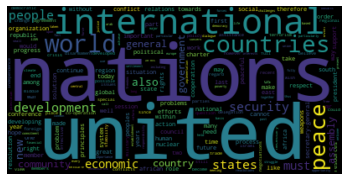

In [ ]:
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

## TF-IDF WordClouds

### Updating Counts for tokens

In [ ]:
counter = Counter()
df['tokens'].map(lambda x: counter.update(set(x)))
N = len(df)

### Storing IDF Values

In [ ]:
idf = dict(map(lambda x: (x[0], np.log(N/x[1]) + 0.1), counter.items()))

### Evaluating TF and Generating Word-Clouds, based on TF-IDF Values

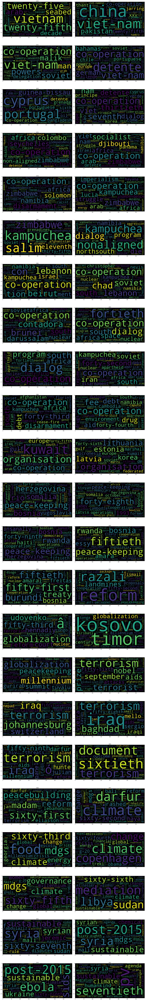

In [ ]:
l_year = 1970
h_year = 2016
clouds = h_year - l_year
rows = math.ceil(clouds / 2)
fig, ax = plt.subplots(rows, 2, figsize=(25, 7.5 * rows))
for ind, y in enumerate(range(l_year, h_year)):
  counter.clear()
  df[df['year'] == y]['tokens'].map(counter.update)
  tfidf = dict(map(lambda x: (x[0], x[1] * idf.get(x[0])), counter.items()))
  
  wc = WordCloud()
  wc.generate_from_frequencies(tfidf)
  ax[ind // 2][ind % 2].imshow(wc, interpolation='bilinear')
  ax[ind // 2][ind % 2].set_title(str(y))
plt.tight_layout()